In this notebook, the three measurements of MSOA topology are imported. Linear regressions are run and Moran's I tests performed on the residuals. With spatial autocorrelation confirmed, Spatial Error Models are run. Scatter plots compare predictions with each other and with MSOA qualities.

# Import Libraries

In [144]:
import geopandas as gpd
import pandas as pd
from mgwr.gwr import GWR
from mgwr.sel_bw import Sel_BW
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
from matplotlib_scalebar.scalebar import ScaleBar
import contextily as cx
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error 
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import libpysal as lps
from esda.moran import Moran
import spreg

In [2]:
pd.set_option('display.float_format', lambda x: '%.4f' % x)

# Import Data

In [3]:
# Y-Values
accessibility = pd.read_csv('clean_y_values/y_n_amenities_15min.csv')

In [4]:
# MSOA Geography
msoa = gpd.read_file("geographies/MSOA_2011_EW_BFC_shp/MSOA_2011_EW_BFC.shp")

In [6]:
# Import and process population data
msoa_pop = pd.read_csv("geographies/msoa_pop.csv")
msoa_pop = msoa_pop.iloc[3:].reset_index(drop=True)
col_names = msoa_pop.iloc[0]  # Capture the 5th row which is now at index 0 after the drop
msoa_pop = msoa_pop[1:]  # Remove the first row
msoa_pop.columns = col_names
msoa_pop = msoa_pop[['MSOA Code', 'All Ages']]
msoa_pop.rename(columns={'MSOA Code': 'MSOA11CD', 'All Ages': 'USUALRES'}, inplace=True)
msoa_pop['USUALRES'] = msoa_pop['USUALRES'].str.replace(',', '', regex=True)
msoa_pop['USUALRES'] = pd.to_numeric(msoa_pop['USUALRES'], errors='coerce')
msoa_pop.dropna(subset=['USUALRES'], inplace=True)
msoa_pop['USUALRES'] = msoa_pop['USUALRES'].astype(int)

In [7]:
# Nodal degree data
nodal_degrees = pd.read_csv('clean_y_values/graph_node_edge_data.csv')

# Assemble data objects

### Overall connectivity

In [8]:
nodal_degrees = pd.merge(nodal_degrees, accessibility, on='MSOA11CD')
nodal_degrees = pd.merge(nodal_degrees, msoa_pop, on='MSOA11CD')

In [9]:
nodal_degrees['population_density'] = nodal_degrees['USUALRES'] / nodal_degrees['area']
nodal_degrees['road_density'] = nodal_degrees['edge_length'] / nodal_degrees['area']
density = nodal_degrees[['MSOA11CD', 'population_density', 'road_density']]

### Predictive Model-Trained Embeddings

In [10]:
embeddings_raw = pd.read_csv('trained_models/n_amenities_15min/GIN/3_layers/embeddings.csv')

In [11]:
embeddings = embeddings_raw.copy()
embeddings.set_index('MSOA11CD', inplace=True)

In [12]:
# Perform Principle Component Analysis on embeddings
# Standardize the data
scaler = StandardScaler()
embeddings_scaled = scaler.fit_transform(embeddings)

# Initialize PCA
pca = PCA(n_components=8)

# Fit PCA on the scaled data
principal_components = pca.fit_transform(embeddings_scaled)

# Create a DataFrame with the principal components
pca_embeddings = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'])

# Display the resulting DataFrame with principal components
pca_embeddings

# Explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)

Explained variance ratio: [7.14004827e-01 1.43488806e-01 9.32403668e-02 4.66078540e-02
 1.44500302e-03 7.99310554e-04 1.95396896e-04 7.51777840e-05]


In [13]:
# Merge with other data
MSOAs = embeddings_raw['MSOA11CD']

embeddings = pd.concat([pca_embeddings, MSOAs], axis=1)
embeddings = pd.merge(embeddings, accessibility, on='MSOA11CD')
embeddings = pd.merge(embeddings, density, on='MSOA11CD')

### Autoencoder Embeddings

In [58]:
ae_embeddings_raw = pd.read_csv('autoencoder_embeddings.csv')

In [59]:
ae_embeddings = ae_embeddings_raw.copy()
ae_embeddings.set_index('MSOA11CD', inplace=True)

In [60]:
# Principle Component Analysis
# Standardize the data
scaler = StandardScaler()
ae_embeddings_scaled = scaler.fit_transform(ae_embeddings)

# Initialize PCA
pca = PCA(n_components=8)

# Fit PCA on the scaled data
principal_components = pca.fit_transform(ae_embeddings_scaled)

# Create a df with the principal components
pca_ae_embeddings = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8'])
pca_ae_embeddings

# Explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)

Explained variance ratio: [0.3794996  0.20057952 0.12386998 0.10037254 0.06858321 0.03607945
 0.02636405 0.01905205]


In [61]:
MSOAs = ae_embeddings_raw['MSOA11CD']

ae_embeddings = pd.concat([pca_ae_embeddings, MSOAs], axis=1)
ae_embeddings = pd.merge(ae_embeddings, accessibility, on='MSOA11CD')
ae_embeddings = pd.merge(ae_embeddings, density, on='MSOA11CD')

## Functions

#### Plot predictions

In [18]:
def plot_predictions(plot_name, legend_title, column_name, df):
    
    gdf = msoa.merge(df, on='MSOA11CD', how='right')
      
    # Initialize figure and subplot mosaic
    fig, axs = plt.subplot_mosaic([
        ["A", "B", "colorbar"],
        ["C", "D", "colorbar"]
    ], figsize=(11, 10), constrained_layout=True,
                                  gridspec_kw={'width_ratios': [1, 1, 0.05], 'height_ratios': [1, 1]})

    city_centers = [(53.491013, -2.314446), (54.983156, -1.608169), 
                    (52.497836, -1.965555), (51.506392, -0.112552)]
    city_names = ["Manchester", "Newcastle", "Birmingham", "London"]

    # Create a GeoDataFrame with city centers
    city_centers_gdf = gpd.GeoDataFrame(geometry=gpd.points_from_xy([lng for lat, lng in city_centers],
                                                                    [lat for lat, lng in city_centers]),
                                        crs="EPSG:4326").to_crs(epsg=27700)
    buffer = 25000  # Buffer in meters

    # Determine the min and max values in the column for consistent color scaling
    vmin = gdf[column_name].min()
    vmax = gdf[column_name].max()

    # Plot each city with the consistent color scale
    for pos, (index, row) in zip(['A', 'B', 'C', 'D'], city_centers_gdf.iterrows()):
        ax = axs[pos]
        ax.set_xlim(row.geometry.x - buffer, row.geometry.x + buffer)
        ax.set_ylim(row.geometry.y - buffer, row.geometry.y + buffer)
        gdf.plot(column=column_name, ax=ax, alpha=0.8, legend=False, cmap='RdBu_r',
                 linewidth=0.1, edgecolor='black', vmin=vmin, vmax=vmax)
        cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
        ax.set_title(city_names[index], position=(0.5, -0.1))
        ax.set_xticks([])
        ax.set_yticks([])

        # Add North Arrow
        ax.annotate('N', xy=(0.96, 0.15), xycoords='axes fraction', xytext=(0.96, 0.1), 
            textcoords='axes fraction', arrowprops=dict(facecolor='black', arrowstyle="->"), 
            ha='center')

        # Add Scale Bar
        scalebar = ScaleBar(1, "m", length_fraction=0.25, location='lower right', scale_loc='top')
        ax.add_artist(scalebar)


    # Configure the colorbar
    cax = axs['colorbar']
    sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=vmin, vmax=vmax))
    #sm._A = []
    fig.colorbar(sm, cax=cax, orientation='vertical').set_label(legend_title)
    fig.suptitle(plot_name, fontsize=16)

    # Display plot
    plt.show()

In [141]:
def plot_predictions(plot_name, legend_title, column_name, df):
    
    gdf = msoa.merge(df, on='MSOA11CD', how='right')
      
    # Initialize figure and subplot mosaic
    fig, axs = plt.subplot_mosaic([
        ["A", "B", "colorbar"],
        ["C", "D", "colorbar"]
    ], figsize=(11, 10), constrained_layout=True,
                                  gridspec_kw={'width_ratios': [1, 1, 0.05], 'height_ratios': [1, 1]})

    city_centers = [(53.491013, -2.314446), (54.983156, -1.608169), 
                    (52.497836, -1.965555), (51.506392, -0.112552)]
    city_names = ["Manchester", "Newcastle", "Birmingham", "London"]

    # Create a GeoDataFrame with city centers
    city_centers_gdf = gpd.GeoDataFrame(geometry=gpd.points_from_xy([lng for lat, lng in city_centers],
                                                                    [lat for lat, lng in city_centers]),
                                        crs="EPSG:4326").to_crs(epsg=27700)
    buffer = 25000  # Buffer in meters

    # TwoSlopeNorm to center colormap at 0
    norm = TwoSlopeNorm(vmin=float('-7.5'), vcenter=0, vmax=13)

    # Plot each city with the consistent color scale
    for pos, (index, row) in zip(['A', 'B', 'C', 'D'], city_centers_gdf.iterrows()):
        ax = axs[pos]
        ax.set_xlim(row.geometry.x - buffer, row.geometry.x + buffer)
        ax.set_ylim(row.geometry.y - buffer, row.geometry.y + buffer)
        gdf.plot(column=column_name, ax=ax, alpha=0.8, legend=False, cmap='RdBu_r',
                 linewidth=0.1, edgecolor='black', norm=norm)
        cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)
        ax.set_title(city_names[index], position=(0.5, -0.1))
        ax.set_xticks([])
        ax.set_yticks([])

        # Add North Arrow
        ax.annotate('N', xy=(0.96, 0.15), xycoords='axes fraction', xytext=(0.96, 0.1), 
            textcoords='axes fraction', arrowprops=dict(facecolor='black', arrowstyle="->"), 
            ha='center')

        # Add Scale Bar
        scalebar = ScaleBar(1, "m", length_fraction=0.25, location='lower right', scale_loc='top')
        ax.add_artist(scalebar)

    # Configure the colorbar
    cax = axs['colorbar']
    sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=norm)
    fig.colorbar(sm, cax=cax, orientation='vertical').set_label(legend_title)
    fig.suptitle(plot_name, fontsize=16)

    # Display plot
    plt.show()

#### Linear function

In [19]:
def linear_regression(df, x_cols, y_col):
    X = df[x_cols]
    y = df[y_col]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_scaled = pd.DataFrame(X_scaled, columns=X.columns)
    X_scaled = sm.add_constant(X_scaled)  # adding a constant after scaling

    model = sm.OLS(y, X_scaled)
    results = model.fit()
    print(results.summary())

    vif_data = pd.DataFrame()
    vif_data["Feature"] = X_scaled.columns

    # Calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(X_scaled.values, i) for i in range(X_scaled.shape[1])]

    print(vif_data)

    df_copy = df.copy()
    df_copy['residuals'] = results.resid

    plot_predictions('Linear Regression Residuals', 'Residual error', 'residuals', df_copy)

    return df_copy

#### Moran's I test

In [26]:
def morans_i(df):
    gdf = pd.merge(msoa, df, on='MSOA11CD', how='right')

    # Step 2: Moran's I Test
    weights = lps.weights.Queen.from_dataframe(gdf)
    weights.transform = 'r'  # Row-standardize the weights
    moran = Moran(df['residuals'], weights)
    print(f"Moran's I: {moran.I}, P-value: {moran.p_sim}")

    if moran.p_sim < 0.05:
        return True

#### Spatial error model

In [21]:
def fit_spatial_error_model(df, x_cols, y_col, plot_title):
    gdf = pd.merge(msoa, df, on='MSOA11CD', how='right')
    
    # Step 1: Extract variables
    y = gdf[y_col].values
    X = gdf[x_cols].values
    
    # Step 2: Standardize the independent variables
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Step 3: Add a constant term to the independent variables (intercept)
    X_scaled = np.hstack([np.ones((X_scaled.shape[0], 1)), X_scaled])
    
    # Step 4: Create a spatial weights matrix using Queen contiguity based on polygons
    weights = lps.weights.Queen.from_dataframe(gdf)
    weights.transform = 'r'  # Ensure the weights are row-standardized
    
    # Step 5: Fit the spatial error model
    model = spreg.ML_Error(y, X_scaled, w=weights, name_y=y_col, 
                           name_x=['constant'] + x_cols)
    
    # Step 6: Extract residuals from the model
    residuals = model.u  # `model.u` contains the residuals
    
    # Step 7: Add residuals to the GeoDataFrame
    gdf['spatial_residuals'] = residuals

    df = gdf[['MSOA11CD', 'spatial_residuals']]
        
    # Plot residuals
    plot_predictions(plot_title, 'Residual error', 'spatial_residuals', df)
    
    # Print the model summary
    print(model.summary)
    
    return gdf

### Whole sequence

In [27]:
def combined_regression_analysis(df, x_cols, y_col, plot_title):
    df = linear_regression(df, x_cols, y_col)
    morantruth = morans_i(df)
    if morantruth == True:
        gdf = fit_spatial_error_model(df, x_cols, y_col, plot_title)
    return gdf

## Run linear regression

### Connectivity

In [142]:
x_cols = ['average_nodal_degree']
y_col = 'n_amenities_15min'
df = nodal_degrees
plot_title = 'Spatial Error Model Residuals for Average Nodal Degree'

                            OLS Regression Results                            
Dep. Variable:      n_amenities_15min   R-squared:                       0.317
Model:                            OLS   Adj. R-squared:                  0.317
Method:                 Least Squares   F-statistic:                     1812.
Date:                Sat, 07 Sep 2024   Prob (F-statistic):               0.00
Time:                        13:58:49   Log-Likelihood:                -9934.3
No. Observations:                3903   AIC:                         1.987e+04
Df Residuals:                    3901   BIC:                         1.989e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    6.9843 

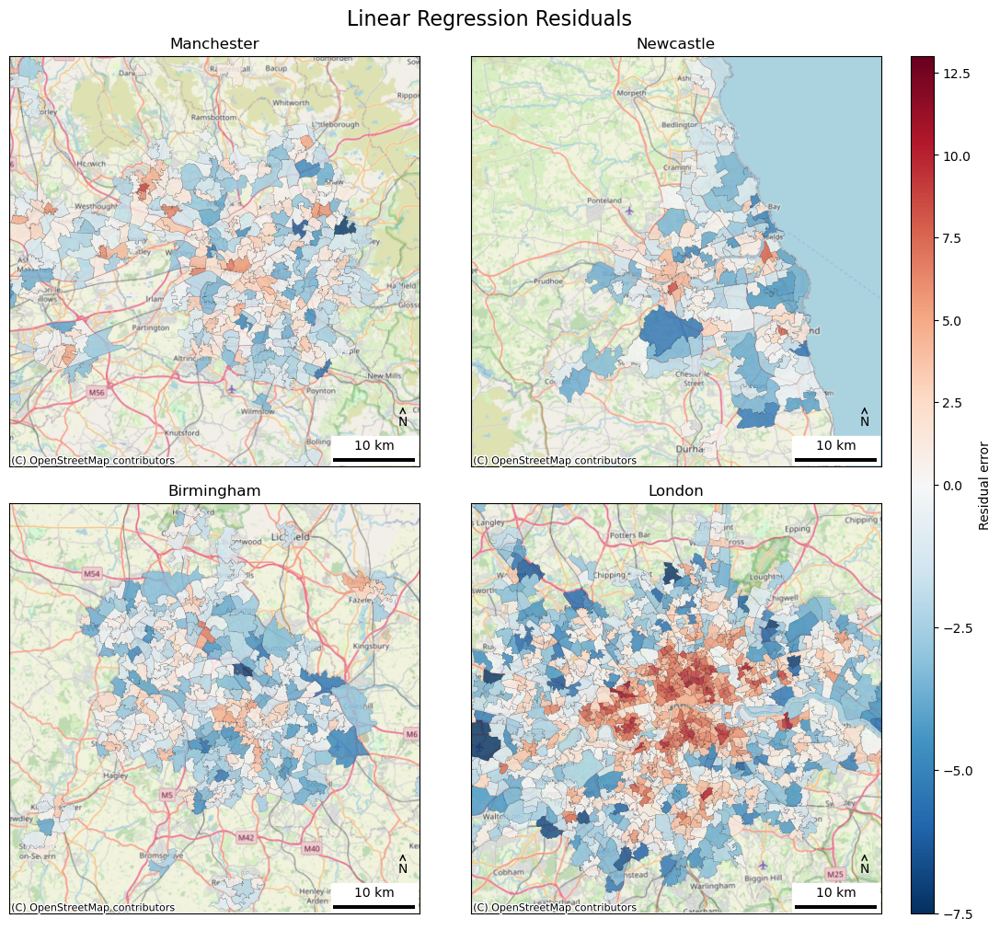

/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_8886/1173449442.py:5: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  weights = lps.weights.Queen.from_dataframe(gdf)
/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 288 disconnected components.
 There are 101 islands with ids: 185, 253, 318, 336, 396, 415, 428, 429, 435, 479, 567, 594, 603, 621, 644, 716, 734, 738, 768, 823, 847, 916, 974, 1098, 1150, 1296, 1304, 1368, 1370, 1398, 1416, 1512, 1555, 1594, 1625, 1663, 1683, 1719, 1761, 1780, 1785, 1795, 1803, 1835, 1843, 1883, 1926, 1951, 1988, 2009, 2039, 2065, 2095, 2115, 2118, 2123, 2214, 2348, 2354, 2453, 2493, 2519, 2523, 2579, 2586, 2657, 2663, 2723, 2914, 2979, 3067, 3077, 3087, 3098, 3117, 3123, 3141, 3190, 3191, 3263, 3275, 3310, 3337, 3348, 3375, 341

('WARNING: ', 185, ' is an island (no neighbors)')
('WARNING: ', 253, ' is an island (no neighbors)')
('WARNING: ', 318, ' is an island (no neighbors)')
('WARNING: ', 336, ' is an island (no neighbors)')
('WARNING: ', 396, ' is an island (no neighbors)')
('WARNING: ', 415, ' is an island (no neighbors)')
('WARNING: ', 428, ' is an island (no neighbors)')
('WARNING: ', 429, ' is an island (no neighbors)')
('WARNING: ', 435, ' is an island (no neighbors)')
('WARNING: ', 479, ' is an island (no neighbors)')
('WARNING: ', 567, ' is an island (no neighbors)')
('WARNING: ', 594, ' is an island (no neighbors)')
('WARNING: ', 603, ' is an island (no neighbors)')
('WARNING: ', 621, ' is an island (no neighbors)')
('WARNING: ', 644, ' is an island (no neighbors)')
('WARNING: ', 716, ' is an island (no neighbors)')
('WARNING: ', 734, ' is an island (no neighbors)')
('WARNING: ', 738, ' is an island (no neighbors)')
('WARNING: ', 768, ' is an island (no neighbors)')
('WARNING: ', 823, ' is an isla

/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 288 disconnected components.
 There are 101 islands with ids: 185, 253, 318, 336, 396, 415, 428, 429, 435, 479, 567, 594, 603, 621, 644, 716, 734, 738, 768, 823, 847, 916, 974, 1098, 1150, 1296, 1304, 1368, 1370, 1398, 1416, 1512, 1555, 1594, 1625, 1663, 1683, 1719, 1761, 1780, 1785, 1795, 1803, 1835, 1843, 1883, 1926, 1951, 1988, 2009, 2039, 2065, 2095, 2115, 2118, 2123, 2214, 2348, 2354, 2453, 2493, 2519, 2523, 2579, 2586, 2657, 2663, 2723, 2914, 2979, 3067, 3077, 3087, 3098, 3117, 3123, 3141, 3190, 3191, 3263, 3275, 3310, 3337, 3348, 3375, 3413, 3465, 3563, 3580, 3664, 3675, 3718, 3733, 3736, 3749, 3766, 3768, 3792, 3796, 3874, 3902.
  W.__init__(self, neighbors, ids=ids, **kw)
/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:913: RuntimeWarning: Method 'bounded' does not support relativ

('WARNING: ', 185, ' is an island (no neighbors)')
('WARNING: ', 253, ' is an island (no neighbors)')
('WARNING: ', 318, ' is an island (no neighbors)')
('WARNING: ', 336, ' is an island (no neighbors)')
('WARNING: ', 396, ' is an island (no neighbors)')
('WARNING: ', 415, ' is an island (no neighbors)')
('WARNING: ', 428, ' is an island (no neighbors)')
('WARNING: ', 429, ' is an island (no neighbors)')
('WARNING: ', 435, ' is an island (no neighbors)')
('WARNING: ', 479, ' is an island (no neighbors)')
('WARNING: ', 567, ' is an island (no neighbors)')
('WARNING: ', 594, ' is an island (no neighbors)')
('WARNING: ', 603, ' is an island (no neighbors)')
('WARNING: ', 621, ' is an island (no neighbors)')
('WARNING: ', 644, ' is an island (no neighbors)')
('WARNING: ', 716, ' is an island (no neighbors)')
('WARNING: ', 734, ' is an island (no neighbors)')
('WARNING: ', 738, ' is an island (no neighbors)')
('WARNING: ', 768, ' is an island (no neighbors)')
('WARNING: ', 823, ' is an isla

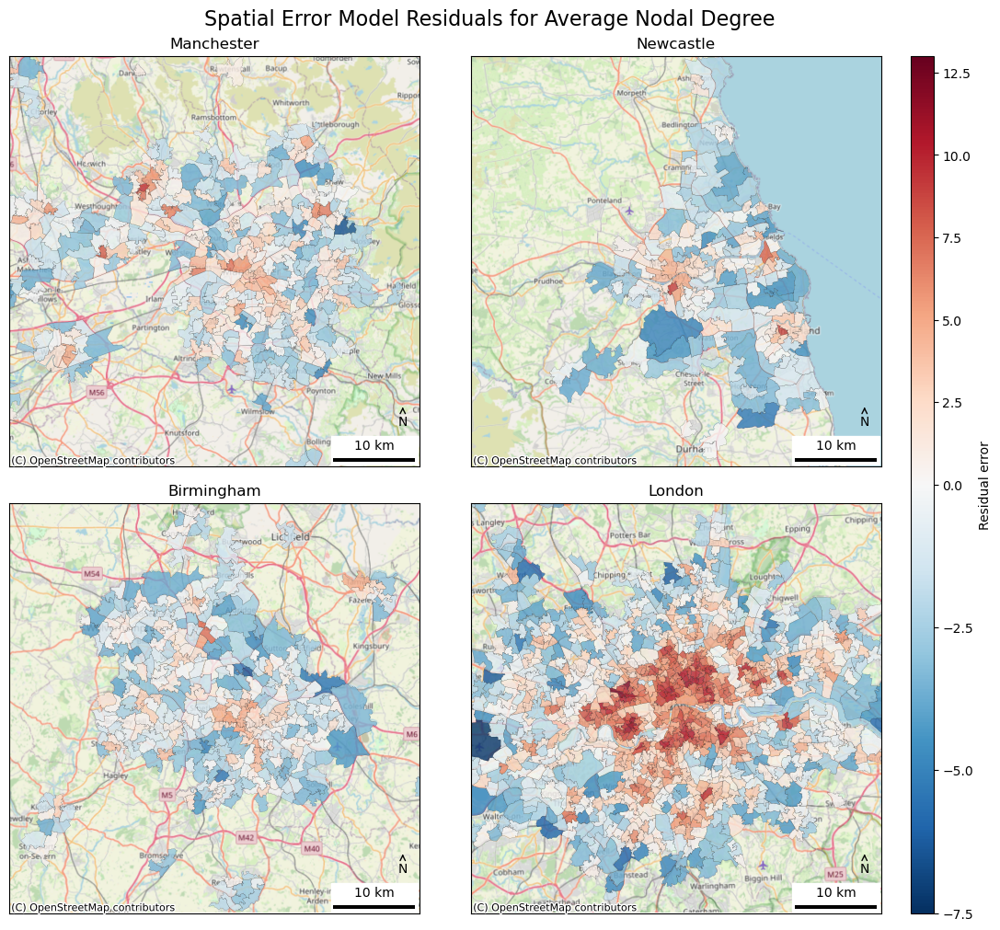

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR (METHOD = full)
---------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :n_amenities_15min                Number of Observations:        3903
Mean dependent var  :      6.9843                Number of Variables   :           2
S.D. dependent var  :      3.7331                Degrees of Freedom    :        3901
Pseudo R-squared    :      0.3171
Log likelihood      :  -9186.1550
Sigma-square ML     :      5.6263                Akaike info criterion :   18376.310
S.E of regression   :      2.3720                Schwarz criterion     :   18388.849

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         6.7224

In [145]:
connectivity_residuals = combined_regression_analysis(df, x_cols, y_col, plot_title)

### On trained embeddings

In [146]:
x_cols = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8']
y_col = 'n_amenities_15min'
plot_title = 'Spatial Error Model Residuals for Graph Prediction Embeddings'
df = embeddings

                            OLS Regression Results                            
Dep. Variable:      n_amenities_15min   R-squared:                       0.413
Model:                            OLS   Adj. R-squared:                  0.412
Method:                 Least Squares   F-statistic:                     342.8
Date:                Sat, 07 Sep 2024   Prob (F-statistic):               0.00
Time:                        14:01:48   Log-Likelihood:                -9638.4
No. Observations:                3903   AIC:                         1.929e+04
Df Residuals:                    3894   BIC:                         1.935e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.9843      0.046    152.429      0.0

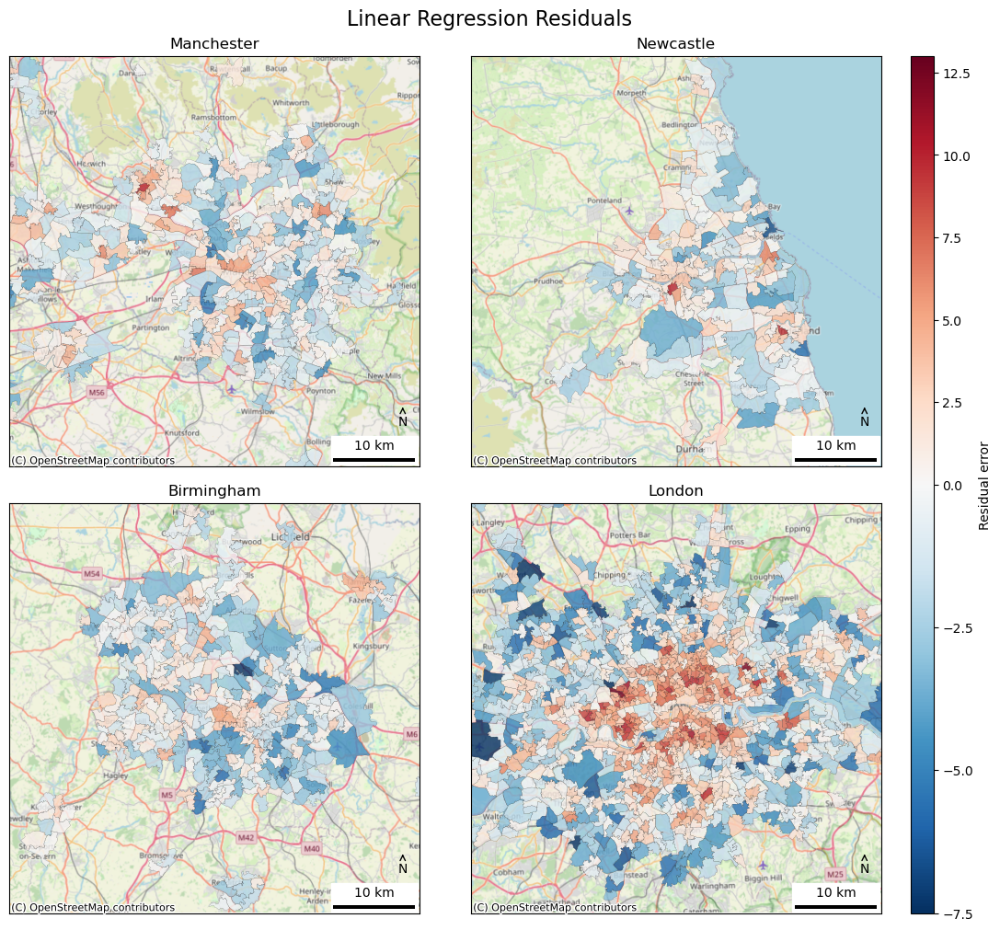

/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_8886/1173449442.py:5: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  weights = lps.weights.Queen.from_dataframe(gdf)
/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 288 disconnected components.
 There are 101 islands with ids: 920, 943, 1086, 1116, 1117, 1118, 1124, 1365, 1366, 1995, 2090, 2115, 2153, 2167, 2217, 2301, 2451, 2484, 2485, 2549, 2653, 2705, 2855, 2856, 2857, 2866, 2896, 2908, 2922, 2931, 2932, 2933, 2937, 2938, 2948, 2949, 2960, 2972, 2973, 2974, 2985, 2995, 2996, 3017, 3020, 3032, 3049, 3051, 3069, 3070, 3108, 3109, 3131, 3161, 3163, 3164, 3180, 3181, 3188, 3213, 3251, 3252, 3269, 3277, 3284, 3292, 3293, 3340, 3371, 3374, 3380, 3383, 3390, 3391, 3392, 3395, 3396, 3400, 3416, 3452, 3470, 3479, 

('WARNING: ', 920, ' is an island (no neighbors)')
('WARNING: ', 943, ' is an island (no neighbors)')
('WARNING: ', 1086, ' is an island (no neighbors)')
('WARNING: ', 1116, ' is an island (no neighbors)')
('WARNING: ', 1117, ' is an island (no neighbors)')
('WARNING: ', 1118, ' is an island (no neighbors)')
('WARNING: ', 1124, ' is an island (no neighbors)')
('WARNING: ', 1365, ' is an island (no neighbors)')
('WARNING: ', 1366, ' is an island (no neighbors)')
('WARNING: ', 1995, ' is an island (no neighbors)')
('WARNING: ', 2090, ' is an island (no neighbors)')
('WARNING: ', 2115, ' is an island (no neighbors)')
('WARNING: ', 2153, ' is an island (no neighbors)')
('WARNING: ', 2167, ' is an island (no neighbors)')
('WARNING: ', 2217, ' is an island (no neighbors)')
('WARNING: ', 2301, ' is an island (no neighbors)')
('WARNING: ', 2451, ' is an island (no neighbors)')
('WARNING: ', 2484, ' is an island (no neighbors)')
('WARNING: ', 2485, ' is an island (no neighbors)')
('WARNING: ', 

/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 288 disconnected components.
 There are 101 islands with ids: 920, 943, 1086, 1116, 1117, 1118, 1124, 1365, 1366, 1995, 2090, 2115, 2153, 2167, 2217, 2301, 2451, 2484, 2485, 2549, 2653, 2705, 2855, 2856, 2857, 2866, 2896, 2908, 2922, 2931, 2932, 2933, 2937, 2938, 2948, 2949, 2960, 2972, 2973, 2974, 2985, 2995, 2996, 3017, 3020, 3032, 3049, 3051, 3069, 3070, 3108, 3109, 3131, 3161, 3163, 3164, 3180, 3181, 3188, 3213, 3251, 3252, 3269, 3277, 3284, 3292, 3293, 3340, 3371, 3374, 3380, 3383, 3390, 3391, 3392, 3395, 3396, 3400, 3416, 3452, 3470, 3479, 3503, 3509, 3537, 3538, 3550, 3552, 3557, 3571, 3574, 3588, 3612, 3614, 3615, 3655, 3676, 3677, 3730, 3748, 3751.
  W.__init__(self, neighbors, ids=ids, **kw)
/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:913: RuntimeWarning: Method 'bounded' doe

('WARNING: ', 920, ' is an island (no neighbors)')
('WARNING: ', 943, ' is an island (no neighbors)')
('WARNING: ', 1086, ' is an island (no neighbors)')
('WARNING: ', 1116, ' is an island (no neighbors)')
('WARNING: ', 1117, ' is an island (no neighbors)')
('WARNING: ', 1118, ' is an island (no neighbors)')
('WARNING: ', 1124, ' is an island (no neighbors)')
('WARNING: ', 1365, ' is an island (no neighbors)')
('WARNING: ', 1366, ' is an island (no neighbors)')
('WARNING: ', 1995, ' is an island (no neighbors)')
('WARNING: ', 2090, ' is an island (no neighbors)')
('WARNING: ', 2115, ' is an island (no neighbors)')
('WARNING: ', 2153, ' is an island (no neighbors)')
('WARNING: ', 2167, ' is an island (no neighbors)')
('WARNING: ', 2217, ' is an island (no neighbors)')
('WARNING: ', 2301, ' is an island (no neighbors)')
('WARNING: ', 2451, ' is an island (no neighbors)')
('WARNING: ', 2484, ' is an island (no neighbors)')
('WARNING: ', 2485, ' is an island (no neighbors)')
('WARNING: ', 

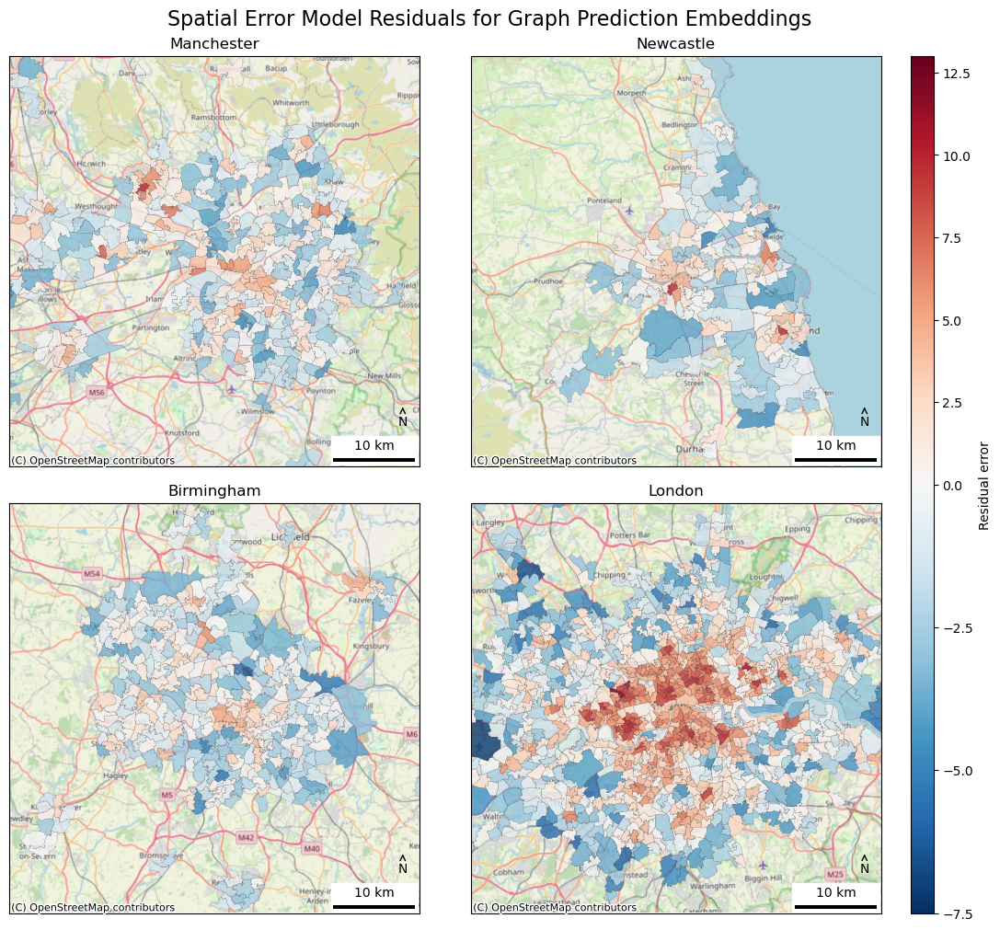

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR (METHOD = full)
---------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :n_amenities_15min                Number of Observations:        3903
Mean dependent var  :      6.9843                Number of Variables   :           9
S.D. dependent var  :      3.7331                Degrees of Freedom    :        3894
Pseudo R-squared    :      0.4093
Log likelihood      :  -9002.9579
Sigma-square ML     :      5.1783                Akaike info criterion :   18023.916
S.E of regression   :      2.2756                Schwarz criterion     :   18080.341

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         6.7790

In [147]:
gnn_residuals = combined_regression_analysis(df, x_cols, y_col, plot_title)

#### Autoencoder Embeddings

In [148]:
x_cols = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8']
y_col = 'n_amenities_15min'
plot_title = 'Spatial Error Model Residuals for Autoencoder Embeddings'
df = ae_embeddings

                            OLS Regression Results                            
Dep. Variable:      n_amenities_15min   R-squared:                       0.413
Model:                            OLS   Adj. R-squared:                  0.412
Method:                 Least Squares   F-statistic:                     342.6
Date:                Sat, 07 Sep 2024   Prob (F-statistic):               0.00
Time:                        14:03:54   Log-Likelihood:                -9638.7
No. Observations:                3903   AIC:                         1.930e+04
Df Residuals:                    3894   BIC:                         1.935e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          6.9843      0.046    152.418      0.0

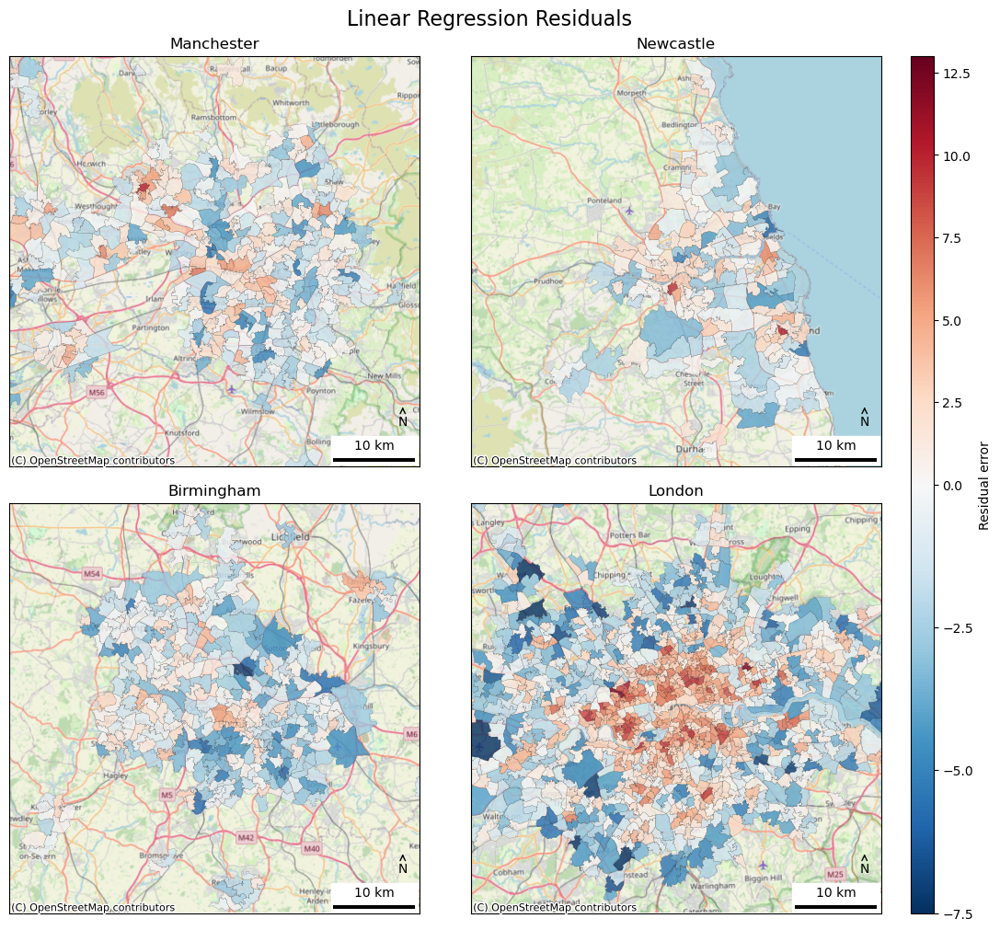

/var/folders/lx/144t732x4hs49_9vxz4j63rh0000gn/T/ipykernel_8886/1173449442.py:5: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  weights = lps.weights.Queen.from_dataframe(gdf)
/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 288 disconnected components.
 There are 101 islands with ids: 920, 943, 1086, 1116, 1117, 1118, 1124, 1365, 1366, 1995, 2090, 2115, 2153, 2167, 2217, 2301, 2451, 2484, 2485, 2549, 2653, 2705, 2855, 2856, 2857, 2866, 2896, 2908, 2922, 2931, 2932, 2933, 2937, 2938, 2948, 2949, 2960, 2972, 2973, 2974, 2985, 2995, 2996, 3017, 3020, 3032, 3049, 3051, 3069, 3070, 3108, 3109, 3131, 3161, 3163, 3164, 3180, 3181, 3188, 3213, 3251, 3252, 3269, 3277, 3284, 3292, 3293, 3340, 3371, 3374, 3380, 3383, 3390, 3391, 3392, 3395, 3396, 3400, 3416, 3452, 3470, 3479, 

('WARNING: ', 920, ' is an island (no neighbors)')
('WARNING: ', 943, ' is an island (no neighbors)')
('WARNING: ', 1086, ' is an island (no neighbors)')
('WARNING: ', 1116, ' is an island (no neighbors)')
('WARNING: ', 1117, ' is an island (no neighbors)')
('WARNING: ', 1118, ' is an island (no neighbors)')
('WARNING: ', 1124, ' is an island (no neighbors)')
('WARNING: ', 1365, ' is an island (no neighbors)')
('WARNING: ', 1366, ' is an island (no neighbors)')
('WARNING: ', 1995, ' is an island (no neighbors)')
('WARNING: ', 2090, ' is an island (no neighbors)')
('WARNING: ', 2115, ' is an island (no neighbors)')
('WARNING: ', 2153, ' is an island (no neighbors)')
('WARNING: ', 2167, ' is an island (no neighbors)')
('WARNING: ', 2217, ' is an island (no neighbors)')
('WARNING: ', 2301, ' is an island (no neighbors)')
('WARNING: ', 2451, ' is an island (no neighbors)')
('WARNING: ', 2484, ' is an island (no neighbors)')
('WARNING: ', 2485, ' is an island (no neighbors)')
('WARNING: ', 

/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/libpysal/weights/contiguity.py:347: UserWarning: The weights matrix is not fully connected: 
 There are 288 disconnected components.
 There are 101 islands with ids: 920, 943, 1086, 1116, 1117, 1118, 1124, 1365, 1366, 1995, 2090, 2115, 2153, 2167, 2217, 2301, 2451, 2484, 2485, 2549, 2653, 2705, 2855, 2856, 2857, 2866, 2896, 2908, 2922, 2931, 2932, 2933, 2937, 2938, 2948, 2949, 2960, 2972, 2973, 2974, 2985, 2995, 2996, 3017, 3020, 3032, 3049, 3051, 3069, 3070, 3108, 3109, 3131, 3161, 3163, 3164, 3180, 3181, 3188, 3213, 3251, 3252, 3269, 3277, 3284, 3292, 3293, 3340, 3371, 3374, 3380, 3383, 3390, 3391, 3392, 3395, 3396, 3400, 3416, 3452, 3470, 3479, 3503, 3509, 3537, 3538, 3550, 3552, 3557, 3571, 3574, 3588, 3612, 3614, 3615, 3655, 3676, 3677, 3730, 3748, 3751.
  W.__init__(self, neighbors, ids=ids, **kw)
/Users/ciaraclarke/anaconda3/lib/python3.11/site-packages/scipy/optimize/_minimize.py:913: RuntimeWarning: Method 'bounded' doe

('WARNING: ', 920, ' is an island (no neighbors)')
('WARNING: ', 943, ' is an island (no neighbors)')
('WARNING: ', 1086, ' is an island (no neighbors)')
('WARNING: ', 1116, ' is an island (no neighbors)')
('WARNING: ', 1117, ' is an island (no neighbors)')
('WARNING: ', 1118, ' is an island (no neighbors)')
('WARNING: ', 1124, ' is an island (no neighbors)')
('WARNING: ', 1365, ' is an island (no neighbors)')
('WARNING: ', 1366, ' is an island (no neighbors)')
('WARNING: ', 1995, ' is an island (no neighbors)')
('WARNING: ', 2090, ' is an island (no neighbors)')
('WARNING: ', 2115, ' is an island (no neighbors)')
('WARNING: ', 2153, ' is an island (no neighbors)')
('WARNING: ', 2167, ' is an island (no neighbors)')
('WARNING: ', 2217, ' is an island (no neighbors)')
('WARNING: ', 2301, ' is an island (no neighbors)')
('WARNING: ', 2451, ' is an island (no neighbors)')
('WARNING: ', 2484, ' is an island (no neighbors)')
('WARNING: ', 2485, ' is an island (no neighbors)')
('WARNING: ', 

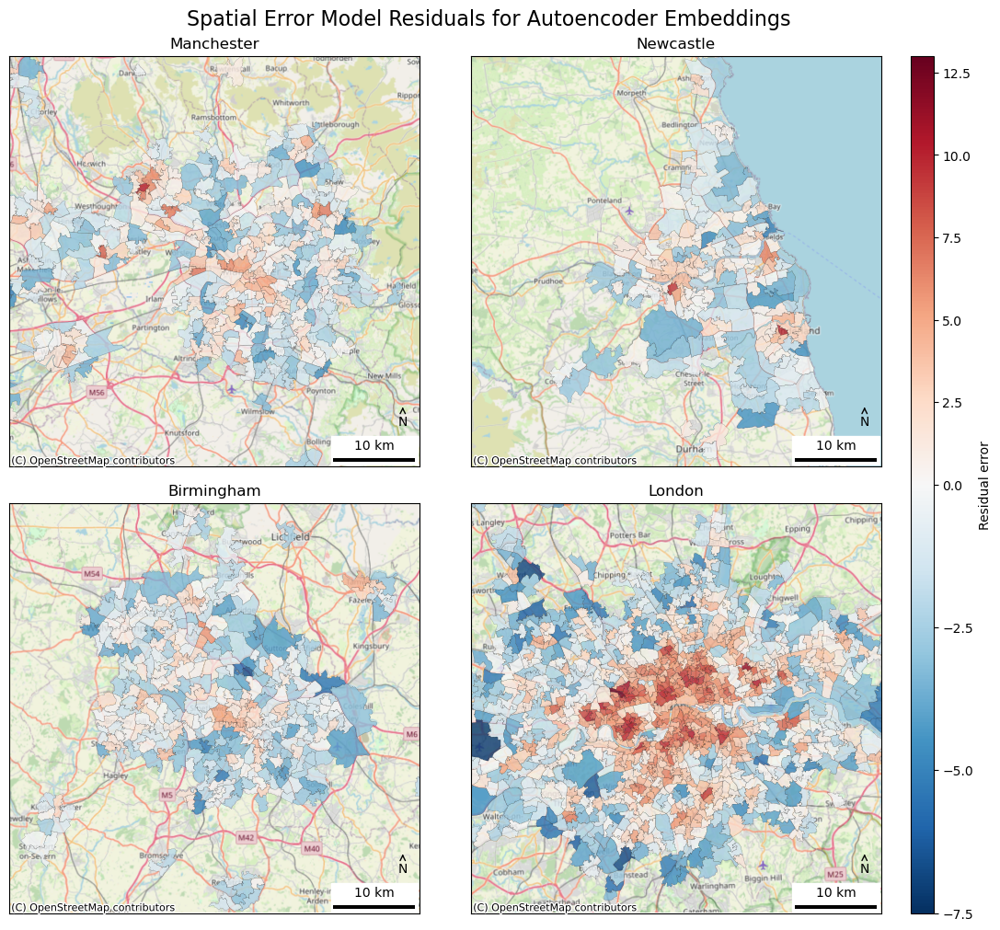

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ML SPATIAL ERROR (METHOD = full)
---------------------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :n_amenities_15min                Number of Observations:        3903
Mean dependent var  :      6.9843                Number of Variables   :           9
S.D. dependent var  :      3.7331                Degrees of Freedom    :        3894
Pseudo R-squared    :      0.4095
Log likelihood      :  -8982.1271
Sigma-square ML     :      5.1124                Akaike info criterion :   17982.254
S.E of regression   :      2.2611                Schwarz criterion     :   18038.680

------------------------------------------------------------------------------------
            Variable     Coefficient       Std.Error     z-Statistic     Probability
------------------------------------------------------------------------------------
            CONSTANT         6.7805

In [149]:
autoencoder_residuals = combined_regression_analysis(df, x_cols, y_col, plot_title)

# Comparing prediction qualities with scatter plots

In [94]:
r1 = connectivity_residuals[['MSOA11CD', 'spatial_residuals', 'average_nodal_degree',
                            'population_density', 'road_density', 'n_amenities_15min']].copy()
r2 = gnn_residuals[['MSOA11CD', 'spatial_residuals']].copy()
r3 = autoencoder_residuals[['MSOA11CD', 'spatial_residuals']].copy()

r1.rename(columns={'spatial_residuals': 'connectivity_residuals'}, inplace=True)
r2.rename(columns={'spatial_residuals': 'gnn_residuals'}, inplace=True)
r3.rename(columns={'spatial_residuals': 'autoencoder_residuals'}, inplace=True)

residuals = pd.merge(r1, r2, on='MSOA11CD')
residuals = pd.merge(residuals, r3, on='MSOA11CD')

residuals['connectivity_predictions'] = residuals['n_amenities_15min'] - residuals['connectivity_residuals']
residuals['gnn_predictions'] = residuals['n_amenities_15min'] - residuals['gnn_residuals']
residuals['autoencoder_predictions'] = residuals['n_amenities_15min'] - residuals['autoencoder_residuals']

In [80]:
def scatter(df, column1, column2, same, title, col_title):
    plt.scatter(df[column1], df[column2], color='black', s=5)
    
    slope, intercept = np.polyfit(df[column1], df[column2], 1)
    x_vals = np.linspace(df[column1].min(), df[column1].max(), 100)
    y_vals = slope * x_vals + intercept
    
    plt.plot(x_vals, y_vals, '-', color='red', label='Best Fit Line')
    plt.xlabel(f'{column1}')
    plt.ylabel(f'{column2}')
    plt.title(f'{title} vs {col_title}')

    # Set the limits for both axes
    if same == True:
        plt.xlim(0, 20)
        plt.ylim(0, 20)
        plt.gca().set_aspect('equal', adjustable='box')

    plt.show()

In [128]:
# Compare residuals
def scatter_residuals(column, col_title, same):
    scatter(residuals, column, 'connectivity_residuals', same, 'Connectivity Residuals', col_title)
    scatter(residuals, column, 'gnn_residuals', same, 'GNN Residuals', col_title)
    scatter(residuals, column, 'autoencoder_residuals', same, 'Autoencoder Residuals', col_title)

In [134]:
# Compare predictions
def scatter_predictions(column, col_title, same):
    scatter(residuals, column, 'connectivity_predictions', same, 'Connectivity Predictions', col_title)
    scatter(residuals, column, 'gnn_predictions', same, 'GNN Predictions', col_title)
    scatter(residuals, column, 'autoencoder_predictions', same, 'Autoencoder Predictions', col_title)

In [117]:
# Compare potential confounding factors
def scatter_confounding(column, col_title, same):
    scatter(residuals, column, 'population_density', same, 'Population Density', col_title)
    scatter(residuals, column, 'road_density', same, 'Road Density', col_title)

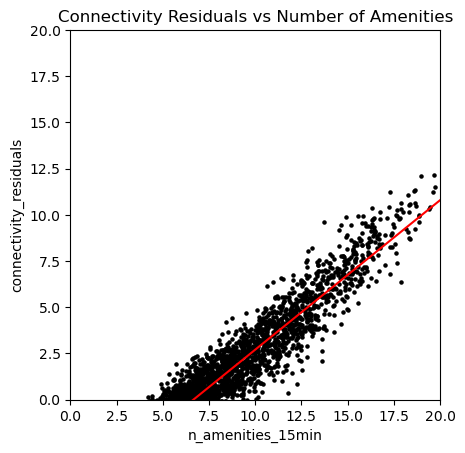

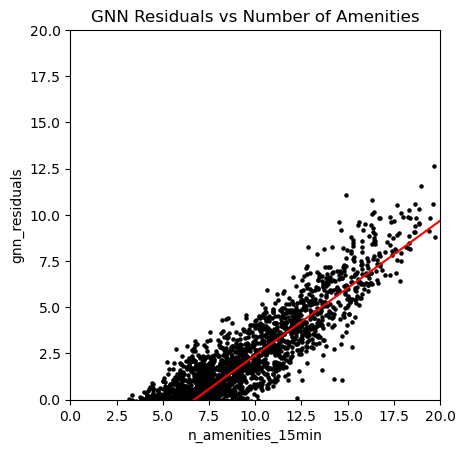

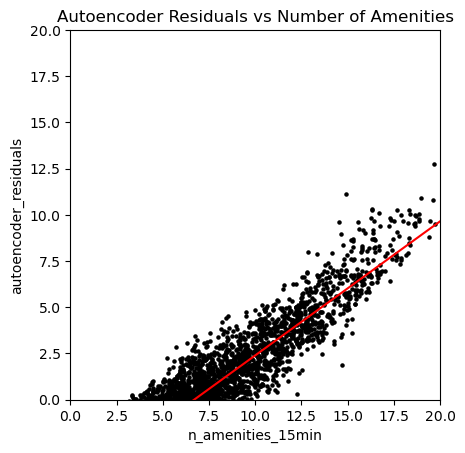

In [136]:
scatter_all('n_amenities_15min', 'Number of Amenities', True)